In [22]:
import sys
import torch
from cz_eye_net import *
from eye_dataset import Eye_Dataset
import argparse,torch
from torch.utils.data import DataLoader
import torch.distributed as dist
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import random
from glob import glob
from alive_progress import alive_it
from alive_progress import config_handler
config_handler.set_global(length = 20, force_tty = True)
from pathlib import Path
from scipy.special import softmax
from tqdm.contrib.concurrent import process_map
from tqdm import tqdm
import cv2
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay

# get focal loss - class weights

In [45]:
check=pd.read_csv('~/data/aurora/eye-blink-production/data/v2.20/v2.20_data_full.csv')


In [52]:
[round(x,5) for x in list(1-check[check.split_type=='train'].label.value_counts()/len(check[check.split_type=='train']))]

[0.48589, 0.73068, 0.78343]

# check loss and lr curves

In [128]:
def get_val_acc_lists(log):
    val_open_acc_list=[]
    val_close_acc_list=[]
    val_block_acc_list=[]
    for x in log:
        if "Acc-close" in x:
            current_open_acc=float(x.split(', ')[0][-6:-1])
            current_close_acc=float(x.split(', ')[1][-6:-1])
            current_block_acc=float(x.split(', ')[2][-7:-2])
            val_open_acc_list.append(current_open_acc)
            val_close_acc_list.append(current_close_acc)
            val_block_acc_list.append(current_block_acc)
    return val_open_acc_list,val_close_acc_list,val_block_acc_list

def get_val_acc_at_lowest_close_acc(val_open_acc_list,val_close_acc_list,val_block_acc_list,max_close_acc,folder):
    pairs=[]
    for i in range(len(val_close_acc_list)):
        current_close_acc = val_close_acc_list[i]
        if current_close_acc==max_close_acc:
            print(f'epoch {i}:',val_open_acc_list[i],val_close_acc_list[i],val_block_acc_list[i])
            pairs.append([folder,str(i)])
    return pairs

In [17]:
all_pairs=[
    ['v2.9.2','762'],
    ['v2.9.2','652'],
    ['v2.9.3','699'],
    ['v2.9.3','989'],
    ['v2.9.4','919'],
    ['v2.9.4','588'],
    ['v2.7.7.1','17'], 
    ['v2.7.7.1','97'], 
    ['v2.7.10.1','900'],
    ['v2.7.10.1','942'],
    ['v2.7.12.1','807'],
    ['v2.7.12.1','835'],
]

In [129]:
test_df.columns

Index(['glasses', 'label', 'index', 'image_path', 'split_type', 'bbox',
       'source', 'person_name', 'which_side', 'old_source_name',
       'v3.0.17.3_epoch641_softmax', 'folder_source',
       'v3.0.17.9_epoch79_softmax', 'v3.0.17.11_epoch84_softmax',
       'v3.0.17.11_epoch123_softmax', 'v3.0.18.1_epoch980_softmax',
       'v3.0.18.2_epoch948_softmax', 'v3.0.18.1_epoch922_softmax',
       'v3.0.18.1_epoch847_softmax', 'v3.0.18.1_epoch872_softmax',
       'v3.0.18.1_epoch908_softmax', 'v3.0.18.2_epoch847_softmax',
       'v3.0.18.2_epoch872_softmax', 'v3.0.18.2_epoch922_softmax',
       'v3.0.18.3_epoch204_softmax', 'v3.0.18.3_epoch241_softmax',
       'v2.0.1_epoch083_softmax', 'v2.7.1_epoch766_softmax',
       'v2.7.2_epoch982_softmax', 'v2.7.3_epoch088_softmax',
       'v2.7.4_epoch099_softmax', 'v2.7.5_epoch092_softmax',
       'v2.7.6_epoch098_softmax', 'v2.7.3.1_epoch092_softmax',
       'v2.7.5.1_epoch092_softmax', 'v2.7.7_epoch097_softmax',
       'v2.7.8_epoch099_softmax

In [367]:
folder = 'v2.9.5'

epoch 584: 88.33 99.86 51.33
epoch 703: 73.83 99.86 73.09
MIN VALID LOSS for model v2.9.5: 0.0199256 at 989
epoch 989: 97.53 95.1 97.08



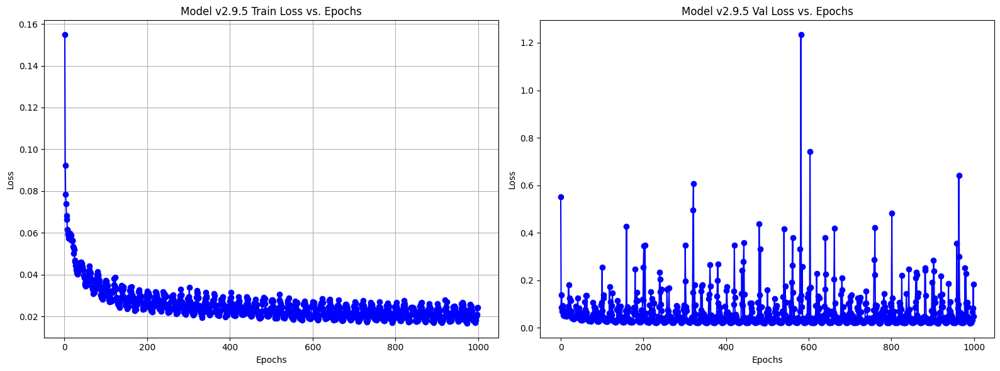

In [368]:
import matplotlib.pyplot as plt
# 0.292652

min_val_loss_list=[]
fig, axs = plt.subplots(1, 2, figsize=(16, 6))
# log_path=f'/home/jovyan/Eye/train/result/{folder}/train2step_record.txt'
log_path=f'/home/jovyan/data/aurora/eye-blink-production/train/result/{folder}/train2step_record.txt'


with open(log_path, 'r') as f:
    log = f.readlines()
train_loss_list = []
val_loss_list = []

for x in log:
    if "train loss" in x:
        train_loss = float(x.split(", ")[0].split(" : ")[1].split(" = ")[1])
        val_loss = float(x.split(", ")[1].split(" = ")[1].split(",")[0])
        train_loss_list.append(train_loss)
        val_loss_list.append(val_loss)

# start, end = 900, 1000
start, end = 0, len(train_loss_list)
epochs = list(range(start, end))

val_open_acc_list,val_close_acc_list,val_block_acc_list=get_val_acc_lists(log)
max_close_acc = max(val_close_acc_list)
pairs=get_val_acc_at_lowest_close_acc(val_open_acc_list,val_close_acc_list,val_block_acc_list,max_close_acc,folder)

# Train loss plot
i=0
axs[0].plot(epochs, train_loss_list[start:end], marker='o', linestyle='-', color='b')
axs[0].set_title(f'Model {folder} Train Loss vs. Epochs')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss')
axs[0].grid(True)

# Validation loss plot
axs[1].plot(epochs, val_loss_list[start:end], marker='o', linestyle='-', color='b')
axs[1].set_title(f'Model {folder} Val Loss vs. Epochs')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss')

epoch = val_loss_list.index(min(val_loss_list))
min_val_loss_list.append(min(val_loss_list))
print(f"MIN VALID LOSS for model {folder}: {min(val_loss_list)} at {epoch}")
print(f'epoch {epoch}:',val_open_acc_list[epoch],val_close_acc_list[epoch],val_block_acc_list[epoch])

lowest_val_loss = min(min_val_loss_list)
lowest_ind = min_val_loss_list.index(lowest_val_loss)
print()
# print(f'lowest val loss: {lowest_val_loss} for model {folder[:-1]+str(lowest_ind)}')
plt.tight_layout()  # Ensures proper spacing between subplots
plt.show()
# MIN VALID LOSS for model 3.0.17.5: 0.0613853 at 125
# 0.113367

In [332]:
print(folder)
lst=[]
for i,(a,b,c) in enumerate(zip(val_open_acc_list,val_close_acc_list,val_block_acc_list)):
    lst.append([i,a,b,c,a+b])
    
print(len(lst))

max_open=max(val_open_acc_list)
max_close=max(val_close_acc_list)
print(max_open,max_close)

largest_sum=0
largest_index=0
for i,l in enumerate(lst):
    o,c=l[1],l[2]
    summation=o+c
    if summation>largest_sum:
        largest_sum=summation
        largest_index=i
    # if summation>max_open+max_close:
    #     print(l)

print(largest_index)
sorted(lst,key=lambda x:x[-1],reverse=True)[:10]

v2.8.4
1000
98.38 99.81
400


[[400, 97.53, 97.75, 91.77, 195.28],
 [989, 98.38, 96.82, 90.74, 195.2],
 [418, 97.98, 97.19, 90.58, 195.17000000000002],
 [484, 97.71, 97.38, 92.64, 195.08999999999997],
 [458, 97.44, 97.57, 93.77, 195.01],
 [408, 97.8, 97.19, 92.1, 194.99],
 [474, 97.8, 97.19, 93.23, 194.99],
 [263, 97.98, 97.0, 89.17, 194.98000000000002],
 [311, 97.4, 97.57, 91.77, 194.97],
 [931, 97.53, 97.38, 92.1, 194.91]]

In [227]:
df=pd.read_csv('~/data/aurora/eye-blink-production/data/v2.20/v2-Copy1.20_data_test_results.csv')
df=df[['glasses', 'label', 'index', 'image_path', 'split_type', 'bbox',
       'source', 'person_name', 'which_side', 'old_source_name','folder_source',
       'v3.0.18.1_epoch908_softmax','v2.0.1_epoch083_softmax']]
df

,glasses,label,index,image_path,split_type,bbox,source,person_name,which_side,old_source_name,folder_source,v3.0.18.1_epoch908_softmax,v2.0.1_epoch083_softmax
0,1.0,open,11459.0,/home/jovyan/data/vol_1/liveness_files/Aurora ...,test,"[139, 227, 215, 303]",new_liveness_data,NaN,left,new_liveness_data_from_close+glasses_labelling,NaN,"[1.0, 4.851869128685848e-09, 5.391685320432771...","[0.11741402745246887, 0.8755288124084473, 0.00..."
1,1.0,open,11460.0,/home/jovyan/data/vol_1/liveness_files/Aurora ...,test,"[137, 282, 223, 368]",new_liveness_data,NaN,left,new_liveness_data_from_close+glasses_labelling,NaN,"[0.9790648221969604, 0.01063630636781454, 0.01...","[0.3860085904598236, 0.5924991369247437, 0.021..."
2,1.0,open,11461.0,/home/jovyan/data/vol_1/liveness_files/Aurora ...,test,"[127, 219, 212, 304]",new_liveness_data,NaN,left,new_liveness_data_from_close+glasses_labelling,NaN,"[1.0, 1.6999467389311462e-09, 5.14518454508561...","[0.46300482749938965, 0.5295508503913879, 0.00..."
3,1.0,open,11462.0,/home/jovyan/data/vol_1/liveness_files/Aurora ...,test,"[124, 231, 198, 305]",new_liveness_data,NaN,left,new_liveness_data_from_close+glasses_labelling,NaN,"[0.992756187915802, 0.0017021804815158248, 0.0...","[0.024364637210965157, 0.9591642618179321, 0.0..."
4,1.0,open,11463.0,/home/jovyan/data/vol_1/liveness_files/Aurora ...,test,"[144, 269, 221, 346]",new_liveness_data,NaN,left,new_liveness_data_from_close+glasses_labelling,NaN,"[0.9143908619880676, 0.00020533197675831616, 0...","[0.0017002713866531849, 0.9982553124427795, 4...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2642,NaN,block,NaN,/home/jovyan/data/aurora/Eye_Blink/real_pen_bl...,test,"[0, 0, 80, 80]",real_block_collection,NaN,NaN,NaN,/home/jovyan/data/aurora/dataset/iso_v2.9_logs...,"[2.354540583837661e-06, 0.001493105199187994, ...","[0.4451434910297394, 0.3230147957801819, 0.231..."
2643,NaN,block,NaN,/home/jovyan/data/aurora/Eye_Blink/real_pen_bl...,test,"[0, 0, 80, 80]",real_block_collection,NaN,NaN,NaN,/home/jovyan/data/aurora/dataset/iso_v2.9_logs...,"[5.3628500609193e-05, 0.0006172058056108654, 0...","[0.7370952367782593, 0.12194603681564331, 0.14..."
2644,NaN,block,NaN,/home/jovyan/data/aurora/Eye_Blink/real_pen_bl...,test,"[0, 0, 80, 80]",real_block_collection,NaN,NaN,NaN,/home/jovyan/data/aurora/dataset/iso_v2.9_logs...,"[2.4028956886468222e-06, 0.0001968700526049360...","[0.6076980233192444, 0.08224666118621826, 0.31..."
2645,NaN,block,NaN,/home/jovyan/data/aurora/Eye_Blink/real_pen_bl...,test,"[0, 0, 80, 80]",real_block_collection,NaN,NaN,NaN,/home/jovyan/data/aurora/dataset/iso_v2.9_logs...,"[3.675170034966868e-07, 0.00021161208860576153...","[0.0865735411643982, 0.8986342549324036, 0.014..."


In [228]:
df.to_csv('~/data/aurora/eye-blink-production/data/v2.20/v2-Copy1.20_data_test_results.csv',index=False)

In [208]:
print(folder)
lst=[]
for i,(a,b,c) in enumerate(zip(val_open_acc_list,val_close_acc_list,val_block_acc_list)):
    lst.append([i,a,b,c,a+b])
    
print(len(lst))

max_open=max(val_open_acc_list)
max_close=max(val_close_acc_list)
print(max_open,max_close)

largest_sum=0
largest_index=0
for i,l in enumerate(lst):
    o,c=l[1],l[2]
    summation=o+c
    if summation>largest_sum:
        largest_sum=summation
        largest_index=i
    # if summation>max_open+max_close:
    #     print(l)

print(largest_index)
sorted(lst,key=lambda x:x[-1],reverse=True)[:10]

1000
99.96 99.86
656


[[656, 99.51, 99.02, 79.81, 198.53],
 [516, 99.46, 99.02, 79.32, 198.48],
 [364, 98.83, 99.3, 69.19, 198.13],
 [784, 98.52, 99.44, 69.79, 197.95999999999998],
 [446, 99.46, 98.46, 77.75, 197.92],
 [288, 98.88, 98.88, 83.54, 197.76],
 [875, 99.01, 98.74, 81.0, 197.75],
 [617, 97.98, 99.72, 79.91, 197.7],
 [267, 99.01, 98.6, 79.59, 197.61],
 [574, 98.7, 98.88, 84.03, 197.57999999999998]]

[[656, 99.51, 99.02, 79.81, 198.53],
 [516, 99.46, 99.02, 79.32, 198.48],
 [364, 98.83, 99.3, 69.19, 198.13],
 [784, 98.52, 99.44, 69.79, 197.95999999999998],
 [446, 99.46, 98.46, 77.75, 197.92],
 [288, 98.88, 98.88, 83.54, 197.76],
 [875, 99.01, 98.74, 81.0, 197.75],
 [617, 97.98, 99.72, 79.91, 197.7],
 [267, 99.01, 98.6, 79.59, 197.61],
 [574, 98.7, 98.88, 84.03, 197.57999999999998]]

In [171]:
sorted(lst,key=lambda x:x[-1],reverse=True)

[[656, 99.51, 99.02, 79.81, 198.53],
 [516, 99.46, 99.02, 79.32, 198.48],
 [364, 98.83, 99.3, 69.19, 198.13],
 [784, 98.52, 99.44, 69.79, 197.95999999999998],
 [446, 99.46, 98.46, 77.75, 197.92],
 [288, 98.88, 98.88, 83.54, 197.76],
 [875, 99.01, 98.74, 81.0, 197.75],
 [617, 97.98, 99.72, 79.91, 197.7],
 [267, 99.01, 98.6, 79.59, 197.61],
 [574, 98.7, 98.88, 84.03, 197.57999999999998],
 [456, 98.92, 98.6, 84.03, 197.51999999999998],
 [545, 98.43, 99.02, 71.95, 197.45],
 [994, 99.46, 97.9, 89.5, 197.36],
 [653, 98.61, 98.74, 90.85, 197.35],
 [348, 98.74, 98.6, 87.06, 197.33999999999997],
 [380, 99.69, 97.62, 48.24, 197.31],
 [927, 97.85, 99.44, 85.11, 197.29],
 [760, 97.94, 99.3, 55.44, 197.24],
 [236, 99.01, 98.18, 87.76, 197.19],
 [789, 99.24, 97.9, 88.31, 197.14],
 [685, 98.47, 98.6, 83.22, 197.07],
 [648, 98.03, 99.02, 90.09, 197.05],
 [794, 99.28, 97.76, 88.52, 197.04000000000002],
 [717, 99.24, 97.76, 76.61, 197.0],
 [894, 97.8, 99.16, 89.6, 196.95999999999998],
 [484, 98.47, 98.4

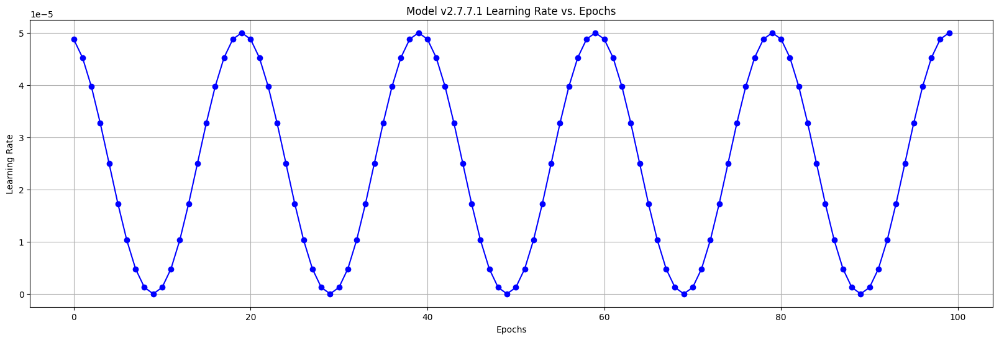

In [ ]:
# plot lr

fig, axs = plt.subplots(1, 1, figsize=(20, 6))
lrs_path=f'/home/jovyan/data/aurora/eye-blink-production/train/result/{folder}/lrs.csv'
lrs_df=pd.read_csv(lrs_path)
lrs_df=lrs_df[~lrs_df.lr.isna()]
epochs_=range(len(lrs_df))
lrs=lrs_df.lr.tolist()

# axs.plot(epochs_[-200:], lrs[-200:], marker='o', linestyle='-', color='b')
axs.plot(epochs_, lrs, marker='o', linestyle='-', color='b')
axs.set_title(f'Model {folder} Learning Rate vs. Epochs')
axs.set_xlabel('Epochs')
axs.set_ylabel('Learning Rate')
axs.grid(True)

In [164]:
# weight_decay= 0.00001
# first_cycle_steps= 5
# cycle_mult= 2
# lr = 0.00005
# max_lr= 0.00005
# min_lr= 0.000001
# warmup_steps= 3
# gamma= 0.5


# from cz_eye_net import *
# from cosine_annealing_warmup import CosineAnnealingWarmupRestarts

# model = Eye_Net(in_channel = 3)


# lrs_tracker=[]
# # setup optimizer and LR scheduler
# optimizer = torch.optim.Adam(model.parameters(), lr = lr, weight_decay = weight_decay)
# # scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max = 10)
# scheduler = CosineAnnealingWarmupRestarts(optimizer,
#                                       first_cycle_steps=first_cycle_steps,
#                                       cycle_mult=cycle_mult,
#                                       max_lr=max_lr,
#                                       min_lr=min_lr,
#                                       warmup_steps=warmup_steps,
#                                       gamma=gamma)

# for i in range(100):
#     scheduler.step()
#     lrs_tracker.append(scheduler.get_lr()[0])

In [107]:
# # plot lr

# from cosine_annealing_warmup import CosineAnnealingWarmupRestarts
# from cz_eye_net import *

# model = Eye_Net(in_channel = 3)

# weight_decay= 0.00001
# first_cycle_steps= 15
# cycle_mult= 4
# max_lr= 0.001
# lr=max_lr
# min_lr= 0.000001
# warmup_steps= 5
# gamma= 0.5
# epochs= 1000

# fig, axs = plt.subplots(1, 1, figsize=(20, 6))

# optimizer = torch.optim.Adam(model.parameters(), lr = lr, weight_decay = weight_decay)
# scheduler = CosineAnnealingWarmupRestarts(optimizer,
#                                           first_cycle_steps=first_cycle_steps,
#                                           cycle_mult=cycle_mult,
#                                           max_lr=max_lr,
#                                           min_lr=min_lr,
#                                           warmup_steps=warmup_steps,
#                                           gamma=gamma)
# lrs=[]
# for i in range(epochs):
#     scheduler.step()
#     lrs.append(scheduler.get_lr()[0])

# # axs.plot(epochs_[-200:], lrs[-200:], marker='o', linestyle='-', color='b')
# axs.plot(lrs, color='b')
# axs.set_title(f'Model {folder} Learning Rate vs. Epochs')
# axs.set_xlabel('Epochs')
# axs.set_ylabel('Learning Rate')
# axs.grid(True)

# model specfific results

In [375]:
import pandas as pd

# csvPath='/home/jovyan/data/aurora/eye-blink-production/data/v2.20/v2-Copy1.20_data_test_results.csv'
csvPath='/home/jovyan/data/aurora/eye-blink-production/data/v2.20/v2.20_data_test_results.csv'

test_df=pd.read_csv(csvPath)
print(test_df.columns)
print()
test_dataset = Eye_Dataset(csvPath, data_type = '',
                           balance = False, augmentation = False, preload = False)

Index(['glasses', 'label', 'index', 'image_path', 'split_type', 'bbox',
       'source', 'person_name', 'which_side', 'old_source_name',
       'v3.0.17.3_epoch641_softmax', 'folder_source',
       'v3.0.17.9_epoch79_softmax', 'v3.0.17.11_epoch84_softmax',
       'v3.0.17.11_epoch123_softmax', 'v3.0.18.1_epoch980_softmax',
       'v3.0.18.2_epoch948_softmax', 'v3.0.18.1_epoch922_softmax',
       'v3.0.18.1_epoch847_softmax', 'v3.0.18.1_epoch872_softmax',
       'v3.0.18.1_epoch908_softmax', 'v3.0.18.2_epoch847_softmax',
       'v3.0.18.2_epoch872_softmax', 'v3.0.18.2_epoch922_softmax',
       'v3.0.18.3_epoch204_softmax', 'v3.0.18.3_epoch241_softmax',
       'v2.0.1_epoch083_softmax', 'v2.7.1_epoch766_softmax',
       'v2.7.2_epoch982_softmax', 'v2.7.3_epoch088_softmax',
       'v2.7.4_epoch099_softmax', 'v2.7.5_epoch092_softmax',
       'v2.7.6_epoch098_softmax', 'v2.7.3.1_epoch092_softmax',
       'v2.7.5.1_epoch092_softmax', 'v2.7.7_epoch097_softmax',
       'v2.7.8_epoch099_softmax

In [254]:
versions=[     'v3.0.18.1_epoch908_softmax',
       'v2.0.1_epoch083_softmax', 'v2.9.2_epoch800_softmax',
       'v2.9.2_epoch521_softmax', 'v2.9.2_epoch994_softmax',
       'v2.9.2_epoch236_softmax', 'v2.9.2_epoch877_softmax',
       'v2.9.3_epoch877_softmax', 'v2.9.3_epoch400_softmax',
       'v2.9.3_epoch616_softmax', 'v2.9.3_epoch985_softmax',
       'v2.9.3_epoch125_softmax', 'v2.9.4_epoch656_softmax',
       'v2.9.4_epoch516_softmax', 'v2.9.4_epoch364_softmax',
       'v2.9.4_epoch784_softmax', 'v2.9.4_epoch446_softmax',
       'v2.9.5_epoch980_softmax', 'v2.9.5_epoch786_softmax',
       'v2.9.5_epoch400_softmax', 'v2.9.5_epoch557_softmax',
       'v2.9.5_epoch617_softmax', 'v2.9.2_epoch652_softmax',
       'v2.9.2_epoch762_softmax', 'v2.9.3_epoch989_softmax',
       'v2.9.3_epoch699_softmax']

In [255]:
print(csvPath)
#set label predictions and softmax
class_mapping={0:"open",1:"close",2:"block"}
reverse_class_mapping={"open":0,"close":1,"block":2}
label=np.array([reverse_class_mapping[x] for x in test_df.label.tolist()])

d={
    'model_version':[],
    'test_open':[],
    'test_close':[],
    'test_block':[]
}
for model_version in versions:
    # print('#########')
    # print(model_version)
    d['model_version'].append(model_version)
    softmax_result=[eval(x) for x in test_df[f"{model_version}"].tolist()]
    prediction=[]
    for i in range(test_dataset.__len__()):
        p=np.argmax(softmax_result[i])
        prediction.append(p)
    prediction=np.array(prediction)
    for c, l in zip(['Open', 'Close', 'Block'], [0, 1, 2]):
        num = sum(label == l)
        corr = sum((prediction == l) & (label == l))
        # print(f'{c}: {round(corr / num * 100,2)}% {corr}/{num}')
        if c=='Open':
            d['test_open'].append(round(corr / num * 100,2))
        elif c=='Close':
            d['test_close'].append(round(corr / num * 100,2))
        elif c=='Block':
            d['test_block'].append(round(corr / num * 100,2))
            
    cm=confusion_matrix(label,prediction)
    cm_disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=["open","close","block"],)
    # print(cm)
    # print()

df=pd.DataFrame.from_dict(d)
df

/home/jovyan/data/aurora/eye-blink-production/data/v2.20/v2-Copy1.20_data_test_results.csv


,model_version,test_open,test_close,test_block
0,v3.0.18.1_epoch908_softmax,99.57,98.09,92.60
1,v2.0.1_epoch083_softmax,78.71,94.39,18.54
2,v2.9.2_epoch800_softmax,99.03,94.77,51.98
3,v2.9.2_epoch521_softmax,98.17,95.15,60.66
4,v2.9.2_epoch994_softmax,98.17,95.28,78.89
5,v2.9.2_epoch236_softmax,97.63,94.52,69.24
6,v2.9.2_epoch877_softmax,98.92,94.39,72.13
7,v2.9.3_epoch877_softmax,99.14,93.11,72.78
8,v2.9.3_epoch400_softmax,98.28,97.07,67.95
9,v2.9.3_epoch616_softmax,97.74,95.66,77.17


In [265]:
df.loc[0],df.loc[1]

(model_version    v3.0.18.1_epoch908_softmax
 test_open                             99.57
 test_close                            98.09
 test_block                             92.6
 Name: 0, dtype: object,
 model_version    v2.0.1_epoch083_softmax
 test_open                          78.71
 test_close                         94.39
 test_block                         18.54
 Name: 1, dtype: object)

In [266]:
df=df.loc[2:]
df

,model_version,test_open,test_close,test_block
2,v2.9.2_epoch800_softmax,99.03,94.77,51.98
3,v2.9.2_epoch521_softmax,98.17,95.15,60.66
4,v2.9.2_epoch994_softmax,98.17,95.28,78.89
5,v2.9.2_epoch236_softmax,97.63,94.52,69.24
6,v2.9.2_epoch877_softmax,98.92,94.39,72.13
7,v2.9.3_epoch877_softmax,99.14,93.11,72.78
8,v2.9.3_epoch400_softmax,98.28,97.07,67.95
9,v2.9.3_epoch616_softmax,97.74,95.66,77.17
10,v2.9.3_epoch985_softmax,99.35,95.28,66.35
11,v2.9.3_epoch125_softmax,97.31,94.39,59.59


In [267]:
# best close
df.loc[df.test_close.idxmax()]

model_version    v2.9.3_epoch699_softmax
test_open                          95.59
test_close                         99.11
test_block                         63.67
Name: 25, dtype: object

In [268]:
# best open
df.loc[df.test_open.idxmax()]

model_version    v2.9.3_epoch985_softmax
test_open                          99.35
test_close                         95.28
test_block                         66.35
Name: 10, dtype: object

In [269]:
df[
    (df.test_close>=94.3) &
    (df.test_open>99)
]

,model_version,test_open,test_close,test_block
2,v2.9.2_epoch800_softmax,99.03,94.77,51.98
10,v2.9.3_epoch985_softmax,99.35,95.28,66.35
12,v2.9.4_epoch656_softmax,99.14,95.03,70.63
17,v2.9.5_epoch980_softmax,99.25,95.28,39.12


In [270]:
# most balanced
df.loc[12]

model_version    v2.9.4_epoch656_softmax
test_open                          99.14
test_close                         95.03
test_block                         70.63
Name: 12, dtype: object

In [126]:
model_version='v2.9.5_epoch584_softmax'

In [127]:
print('#########')
print(model_version)
softmax_result=[eval(x) for x in test_df[f"{model_version}"].tolist()]
prediction=[]
for i in range(test_dataset.__len__()):
    p=np.argmax(softmax_result[i])
    prediction.append(p)
prediction=np.array(prediction)
for c, l in zip(['Open', 'Close', 'Block'], [0, 1, 2]):
    num = sum(label == l)
    corr = sum((prediction == l) & (label == l))
    print(f'{c}: {round(corr / num * 100,2)}% {corr}/{num}')
cm=confusion_matrix(label,prediction)
cm_disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=["open","close","block"],)
print(cm)
print()

#########
v2.9.5_epoch584_softmax
Open: 88.92% 827/930
Close: 99.62% 781/784
Block: 57.98% 541/933
[[827  85  18]
 [  2 781   1]
 [172 220 541]]



In [394]:
test_df.columns

Index(['glasses', 'label', 'index', 'image_path', 'split_type', 'bbox',
       'source', 'person_name', 'which_side', 'old_source_name',
       'v3.0.17.3_epoch641_softmax', 'folder_source',
       'v3.0.17.9_epoch79_softmax', 'v3.0.17.11_epoch84_softmax',
       'v3.0.17.11_epoch123_softmax', 'v3.0.18.1_epoch980_softmax',
       'v3.0.18.2_epoch948_softmax', 'v3.0.18.1_epoch922_softmax',
       'v3.0.18.1_epoch847_softmax', 'v3.0.18.1_epoch872_softmax',
       'v3.0.18.1_epoch908_softmax', 'v3.0.18.2_epoch847_softmax',
       'v3.0.18.2_epoch872_softmax', 'v3.0.18.2_epoch922_softmax',
       'v3.0.18.3_epoch204_softmax', 'v3.0.18.3_epoch241_softmax',
       'v2.0.1_epoch083_softmax', 'v2.7.1_epoch766_softmax',
       'v2.7.2_epoch982_softmax', 'v2.7.3_epoch088_softmax',
       'v2.7.4_epoch099_softmax', 'v2.7.5_epoch092_softmax',
       'v2.7.6_epoch098_softmax', 'v2.7.3.1_epoch092_softmax',
       'v2.7.5.1_epoch092_softmax', 'v2.7.7_epoch097_softmax',
       'v2.7.8_epoch099_softmax

In [405]:

# 281 906, 282 948, 283 953, 284 991, 285 939, 286 911, 287 953, 288 991
# 291 224, 292 652, 293 989, 294 588, 295 989
# 2771 97, 27101 942, 27121 835

model_ver,epoch='v2.9.3','985'
model_version=f'{model_ver}_epoch{epoch}_softmax'
# model_version='v2.9.3_epoch699_softmax'

In [406]:
#set label predictions and softmax
class_mapping={0:"open",1:"close",2:"block"}
reverse_class_mapping={"open":0,"close":1,"block":2}

label=np.array([reverse_class_mapping[x] for x in test_df.label.tolist()])
softmax_result=[eval(x) for x in test_df[f"{model_version}"].tolist()]

print(csvPath)
print(model_version)

thre_close = 0.6
thre_block = 0.8
print()
print(f"threshold\nthre_close: {thre_close}, thre_block: {thre_block}")

prediction=[]

for i in range(test_dataset.__len__()):
    p=softmax_result[i]
    if p[2]>thre_block:
        prediction.append(2)
    elif p[1]>thre_close:
        prediction.append(1)
    else:
        prediction.append(0) 

prediction=np.array(prediction)

from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay


for c, l in zip(['Open', 'Close', 'Block'], [0, 1, 2]):
    num = sum(label == l)
    corr = sum((prediction == l) & (label == l))
    print(f'{c}: {round(corr / num * 100,2)}% {corr}/{num}')

cm=confusion_matrix(label,prediction)
cm_disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=["open","close","block"],)
print(cm)
print()

print("argmax")

prediction=[]

for i in range(test_dataset.__len__()):
    p=np.argmax(softmax_result[i])
    prediction.append(p)

prediction=np.array(prediction)

from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay

for c, l in zip(['Open', 'Close', 'Block'], [0, 1, 2]):
    num = sum(label == l)
    corr = sum((prediction == l) & (label == l))
    print(f'{c}: {round(corr / num * 100,2)}% {corr}/{num}')

cm=confusion_matrix(label,prediction)
cm_disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=["open","close","block"],)
print(cm)

/home/jovyan/data/aurora/eye-blink-production/data/v2.20/v2.20_data_test_results.csv
v2.9.3_epoch985_softmax

threshold
thre_close: 0.6, thre_block: 0.8
Open: 99.68% 927/930
Close: 90.69% 711/784
Block: 29.8% 278/933
[[927   3   0]
 [ 73 711   0]
 [640  15 278]]

argmax
Open: 99.35% 924/930
Close: 95.28% 747/784
Block: 66.35% 619/933
[[924   3   3]
 [ 30 747   7]
 [264  50 619]]


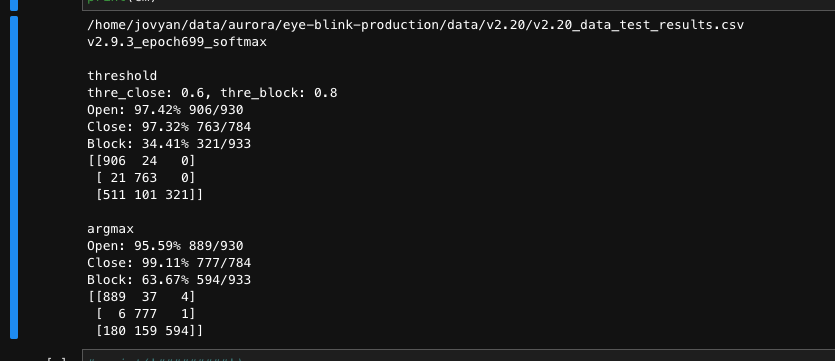

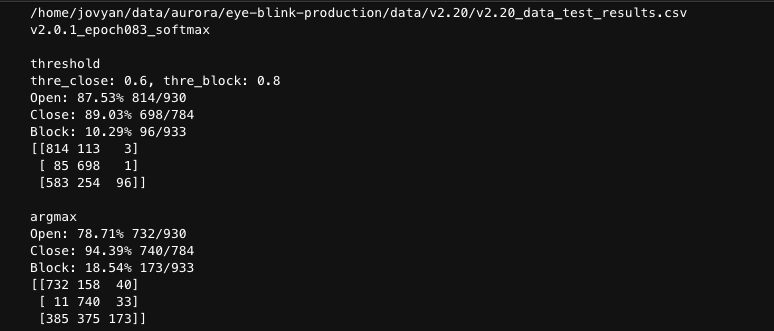

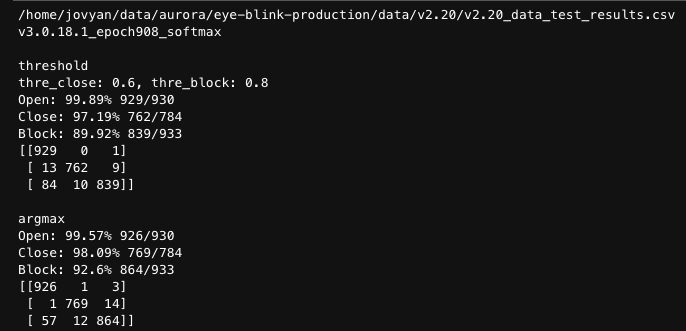

In [ ]:
# print('#########')
# print(model_version)
# softmax_result=[eval(x) for x in test_df[f"{model_version}"].tolist()]
# prediction=[]
# for i in range(test_dataset.__len__()):
#     p=np.argmax(softmax_result[i])
#     prediction.append(p)
# prediction=np.array(prediction)
# for c, l in zip(['Open', 'Close', 'Block'], [0, 1, 2]):
#     num = sum(label == l)
#     corr = sum((prediction == l) & (label == l))
#     print(f'{c}: {round(corr / num * 100,2)}% {corr}/{num}')
# cm=confusion_matrix(label,prediction)
# cm_disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=["open","close","block"],)
# print(cm)
# print()


In [173]:
# versions=['v2.9.3_epoch877_softmax', 'v2.9.3_epoch400_softmax',
#        'v2.9.3_epoch616_softmax', 'v2.9.3_epoch985_softmax']

versions=['v2.9.4_epoch656_softmax', 'v2.9.4_epoch516_softmax',
       'v2.9.4_epoch364_softmax', 'v2.9.4_epoch784_softmax',
       'v2.9.4_epoch446_softmax']

In [174]:
print(csvPath)
#set label predictions and softmax
class_mapping={0:"open",1:"close",2:"block"}
reverse_class_mapping={"open":0,"close":1,"block":2}
label=np.array([reverse_class_mapping[x] for x in test_df.label.tolist()])

for model_version in versions:
    print('#########')
    print(model_version)
    softmax_result=[eval(x) for x in test_df[f"{model_version}"].tolist()]
    prediction=[]
    for i in range(test_dataset.__len__()):
        p=np.argmax(softmax_result[i])
        prediction.append(p)
    prediction=np.array(prediction)
    for c, l in zip(['Open', 'Close', 'Block'], [0, 1, 2]):
        num = sum(label == l)
        corr = sum((prediction == l) & (label == l))
        print(f'{c}: {round(corr / num * 100,2)}% {corr}/{num}')
    cm=confusion_matrix(label,prediction)
    cm_disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=["open","close","block"],)
    print(cm)
    print()

/home/jovyan/data/aurora/eye-blink-production/data/v2.20/v2.20_data_test_results.csv
#########
v2.9.4_epoch656_softmax
Open: 99.14% 922/930
Close: 95.03% 745/784
Block: 70.63% 659/933
[[922   6   2]
 [ 35 745   4]
 [230  44 659]]

#########
v2.9.4_epoch516_softmax
Open: 99.03% 921/930
Close: 92.35% 724/784
Block: 72.03% 672/933
[[921   6   3]
 [ 48 724  12]
 [227  34 672]]

#########
v2.9.4_epoch364_softmax
Open: 97.63% 908/930
Close: 96.17% 754/784
Block: 64.2% 599/933
[[908  17   5]
 [ 25 754   5]
 [250  84 599]]

#########
v2.9.4_epoch784_softmax
Open: 98.06% 912/930
Close: 97.07% 761/784
Block: 62.92% 587/933
[[912  12   6]
 [ 13 761  10]
 [236 110 587]]

#########
v2.9.4_epoch446_softmax
Open: 98.82% 919/930
Close: 92.86% 728/784
Block: 66.45% 620/933
[[919   6   5]
 [ 45 728  11]
 [252  61 620]]



In [220]:
#set label predictions and softmax
class_mapping={0:"open",1:"close",2:"block"}
reverse_class_mapping={"open":0,"close":1,"block":2}

label=np.array([reverse_class_mapping[x] for x in test_df.label.tolist()])
softmax_result=[eval(x) for x in test_df[f"{model_version}"].tolist()]

print(csvPath)
print(model_version)

thre_close = 0.6
thre_block = 0.8
print()
print(f"threshold\nthre_close: {thre_close}, thre_block: {thre_block}")

prediction=[]

for i in range(test_dataset.__len__()):
    p=softmax_result[i]
    if p[2]>thre_block:
        prediction.append(2)
    elif p[1]>thre_close:
        prediction.append(1)
    else:
        prediction.append(0) 
        
prediction=np.array(prediction)

from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay


for c, l in zip(['Open', 'Close', 'Block'], [0, 1, 2]):
    num = sum(label == l)
    corr = sum((prediction == l) & (label == l))
    print(f'{c}: {round(corr / num * 100,2)}% {corr}/{num}')

cm=confusion_matrix(label,prediction)
cm_disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=["open","close","block"],)
print(cm)
print()

print("argmax")

prediction=[]

for i in range(test_dataset.__len__()):
    p=np.argmax(softmax_result[i])
    prediction.append(p)
        
prediction=np.array(prediction)

from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay

for c, l in zip(['Open', 'Close', 'Block'], [0, 1, 2]):
    num = sum(label == l)
    corr = sum((prediction == l) & (label == l))
    print(f'{c}: {round(corr / num * 100,2)}% {corr}/{num}')

cm=confusion_matrix(label,prediction)
cm_disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=["open","close","block"],)
print(cm)

/home/jovyan/data/aurora/eye-blink-production/data/v2.20/v2.20_data_test_results.csv
v2.9.2_epoch652_softmax

threshold
thre_close: 0.6, thre_block: 0.8
Open: 99.68% 927/930
Close: 83.93% 658/784
Block: 65.06% 607/933
[[927   1   2]
 [119 658   7]
 [313  13 607]]

argmax
Open: 96.13% 894/930
Close: 92.86% 728/784
Block: 86.07% 803/933
[[894   5  31]
 [ 22 728  34]
 [ 95  35 803]]


In [213]:
#set label predictions and softmax
class_mapping={0:"open",1:"close",2:"block"}
reverse_class_mapping={"open":0,"close":1,"block":2}

label=np.array([reverse_class_mapping[x] for x in test_df.label.tolist()])
softmax_result=[eval(x) for x in test_df[f"{model_version}"].tolist()]

print(csvPath)
print(model_version)

thre_close = 0.6
thre_block = 0.8
print()
print(f"threshold\nthre_close: {thre_close}, thre_block: {thre_block}")

prediction=[]

for i in range(test_dataset.__len__()):
    p=softmax_result[i]
    if p[2]>thre_block:
        prediction.append(2)
    elif p[1]>thre_close:
        prediction.append(1)
    else:
        prediction.append(0) 
        
prediction=np.array(prediction)

from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay


for c, l in zip(['Open', 'Close', 'Block'], [0, 1, 2]):
    num = sum(label == l)
    corr = sum((prediction == l) & (label == l))
    print(f'{c}: {round(corr / num * 100,2)}% {corr}/{num}')

cm=confusion_matrix(label,prediction)
cm_disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=["open","close","block"],)
print(cm)
print()

print("argmax")

prediction=[]

for i in range(test_dataset.__len__()):
    p=np.argmax(softmax_result[i])
    prediction.append(p)
        
prediction=np.array(prediction)

from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay

for c, l in zip(['Open', 'Close', 'Block'], [0, 1, 2]):
    num = sum(label == l)
    corr = sum((prediction == l) & (label == l))
    print(f'{c}: {round(corr / num * 100,2)}% {corr}/{num}')

cm=confusion_matrix(label,prediction)
cm_disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=["open","close","block"],)
print(cm)

/home/jovyan/data/aurora/eye-blink-production/data/v2.20/v2.20_data_test_results.csv
v2.9.2_epoch762_softmax

threshold
thre_close: 0.6, thre_block: 0.8
Open: 96.34% 896/930
Close: 96.05% 753/784
Block: 33.12% 309/933
[[896  33   1]
 [ 31 753   0]
 [506 118 309]]

argmax
Open: 90.86% 845/930
Close: 98.6% 773/784
Block: 69.88% 652/933
[[845  66  19]
 [  5 773   6]
 [ 97 184 652]]


In [121]:
versions=['v2.8.1_epoch906_softmax',
       'v2.8.2_epoch948_softmax', 'v2.8.3_epoch953_softmax',
       'v2.8.4_epoch991_softmax', 'v2.8.5_epoch939_softmax',
       'v2.8.6_epoch911_softmax', 'v2.8.7_epoch953_softmax',
       'v2.8.8_epoch991_softmax']
for model_version in versions:
    print(" ##### ")
#set label predictions and softmax
    class_mapping={0:"open",1:"close",2:"block"}
    reverse_class_mapping={"open":0,"close":1,"block":2}

    label=np.array([reverse_class_mapping[x] for x in test_df.label.tolist()])
    softmax_result=[eval(x) for x in test_df[f"{model_version}"].tolist()]

    print(csvPath)
    print(model_version)

#     thre_close = 0.6
#     thre_block = 0.8
#     print()
#     print(f"threshold\nthre_close: {thre_close}, thre_block: {thre_block}")

#     prediction=[]

#     for i in range(test_dataset.__len__()):
#         p=softmax_result[i]
#         if p[2]>thre_block:
#             prediction.append(2)
#         elif p[1]>thre_close:
#             prediction.append(1)
#         else:
#             prediction.append(0) 

#     prediction=np.array(prediction)

#     from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay


#     for c, l in zip(['Open', 'Close', 'Block'], [0, 1, 2]):
#         num = sum(label == l)
#         corr = sum((prediction == l) & (label == l))
#         print(f'{c}: {round(corr / num * 100,2)}% {corr}/{num}')

#     cm=confusion_matrix(label,prediction)
#     cm_disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=["open","close","block"],)
#     print(cm)
#     print()

    print("argmax")

    prediction=[]

    for i in range(test_dataset.__len__()):
        p=np.argmax(softmax_result[i])
        prediction.append(p)

    prediction=np.array(prediction)

    from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay

    for c, l in zip(['Open', 'Close', 'Block'], [0, 1, 2]):
        num = sum(label == l)
        corr = sum((prediction == l) & (label == l))
        print(f'{c}: {round(corr / num * 100,2)}% {corr}/{num}')

    cm=confusion_matrix(label,prediction)
    cm_disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=["open","close","block"],)
    print(cm)

 ##### 
/home/jovyan/data/aurora/eye-blink-production/data/v2.20/v2.20_data_test_results.csv
v2.8.1_epoch906_softmax
argmax
Open: 92.9% 864/930
Close: 78.06% 612/784
Block: 90.03% 840/933
[[864  10  56]
 [101 612  71]
 [ 83  10 840]]
 ##### 
/home/jovyan/data/aurora/eye-blink-production/data/v2.20/v2.20_data_test_results.csv
v2.8.2_epoch948_softmax
argmax
Open: 94.19% 876/930
Close: 82.02% 643/784
Block: 87.78% 819/933
[[876   7  47]
 [ 84 643  57]
 [ 85  29 819]]
 ##### 
/home/jovyan/data/aurora/eye-blink-production/data/v2.20/v2.20_data_test_results.csv
v2.8.3_epoch953_softmax
argmax
Open: 94.62% 880/930
Close: 85.46% 670/784
Block: 87.14% 813/933
[[880  18  32]
 [ 80 670  34]
 [ 93  27 813]]
 ##### 
/home/jovyan/data/aurora/eye-blink-production/data/v2.20/v2.20_data_test_results.csv
v2.8.4_epoch991_softmax
argmax
Open: 95.91% 892/930
Close: 84.82% 665/784
Block: 88.75% 828/933
[[892   8  30]
 [ 85 665  34]
 [ 89  16 828]]
 ##### 
/home/jovyan/data/aurora/eye-blink-production/data/v2

In [9]:
# # per source prediction

# print(model_version)
# current_pred_col_name='current_model_argmax_pred'
# test_df[current_pred_col_name]=prediction
# test_df[current_pred_col_name]=test_df[current_pred_col_name].apply(lambda x: class_mapping[x])
# # test_df.head()
# for source in test_df.source.unique():
#     print()
#     print()
#     print(source)
#     source_df=test_df[test_df.source==source]
#     labels=source_df.label
#     predictions=source_df[current_pred_col_name]
#     for c, l in zip(['open', 'close', 'block'], ['open', 'close', 'block']):
#         num = sum(labels == l)
#         if num==0:
#             print('%s: %d \t Correct: %d, %.2f%%' % (c,0,0, 0 * 100))
#             continue
#         corr = sum((predictions == l) & (labels == l))
#         print('%s: %d \t Correct: %d, %.2f%%' % (c, num, corr, corr / num * 100))
    

# zhitao case study

In [275]:
import pandas as pd

csvPath='/home/jovyan/data/aurora/eye-blink-production/data/v2.20/v2.20_data_test_results.csv'

test_df=pd.read_csv(csvPath)
print(test_df.columns)
print()
test_dataset = Eye_Dataset(csvPath, data_type = '',
                           balance = False, augmentation = False, preload = False)

Index(['glasses', 'label', 'index', 'image_path', 'split_type', 'bbox',
       'source', 'person_name', 'which_side', 'old_source_name',
       'v3.0.17.3_epoch641_softmax', 'folder_source',
       'v3.0.17.9_epoch79_softmax', 'v3.0.17.11_epoch84_softmax',
       'v3.0.17.11_epoch123_softmax', 'v3.0.18.1_epoch980_softmax',
       'v3.0.18.2_epoch948_softmax', 'v3.0.18.1_epoch922_softmax',
       'v3.0.18.1_epoch847_softmax', 'v3.0.18.1_epoch872_softmax',
       'v3.0.18.1_epoch908_softmax', 'v3.0.18.2_epoch847_softmax',
       'v3.0.18.2_epoch872_softmax', 'v3.0.18.2_epoch922_softmax',
       'v3.0.18.3_epoch204_softmax', 'v3.0.18.3_epoch241_softmax',
       'v2.0.1_epoch083_softmax', 'v2.7.1_epoch766_softmax',
       'v2.7.2_epoch982_softmax', 'v2.7.3_epoch088_softmax',
       'v2.7.4_epoch099_softmax', 'v2.7.5_epoch092_softmax',
       'v2.7.6_epoch098_softmax', 'v2.7.3.1_epoch092_softmax',
       'v2.7.5.1_epoch092_softmax', 'v2.7.7_epoch097_softmax',
       'v2.7.8_epoch099_softmax

In [277]:
# check zhitao

#save all of zhitao cropped images in list first to easily run
zhitao_cropped_images=[]

zhitao=test_df[(test_df.person_name=='zhitao')]
print(len(zhitao))

for i in tqdm(range(len(zhitao))):
    try:
        path=zhitao.iloc[i]['image_path']
        bbox=zhitao.iloc[i]['bbox']     
        image=cv2.cvtColor(cv2.imread(path),cv2.COLOR_BGR2RGB)
        l,t,r,b=eval(bbox)
        zhitao_cropped_images.append(image[t:b,l:r])
        
    except:
        print(i)
        continue
        
print(len(zhitao))
zhitao.columns

104


100%|██████████| 104/104 [00:55<00:00,  1.87it/s]

104


Index(['glasses', 'label', 'index', 'image_path', 'split_type', 'bbox',
       'source', 'person_name', 'which_side', 'old_source_name',
       'v3.0.17.3_epoch641_softmax', 'folder_source',
       'v3.0.17.9_epoch79_softmax', 'v3.0.17.11_epoch84_softmax',
       'v3.0.17.11_epoch123_softmax', 'v3.0.18.1_epoch980_softmax',
       'v3.0.18.2_epoch948_softmax', 'v3.0.18.1_epoch922_softmax',
       'v3.0.18.1_epoch847_softmax', 'v3.0.18.1_epoch872_softmax',
       'v3.0.18.1_epoch908_softmax', 'v3.0.18.2_epoch847_softmax',
       'v3.0.18.2_epoch872_softmax', 'v3.0.18.2_epoch922_softmax',
       'v3.0.18.3_epoch204_softmax', 'v3.0.18.3_epoch241_softmax',
       'v2.0.1_epoch083_softmax', 'v2.7.1_epoch766_softmax',
       'v2.7.2_epoch982_softmax', 'v2.7.3_epoch088_softmax',
       'v2.7.4_epoch099_softmax', 'v2.7.5_epoch092_softmax',
       'v2.7.6_epoch098_softmax', 'v2.7.3.1_epoch092_softmax',
       'v2.7.5.1_epoch092_softmax', 'v2.7.7_epoch097_softmax',
       'v2.7.8_epoch099_softmax

100%|██████████| 104/104 [00:02<00:00, 43.37it/s]


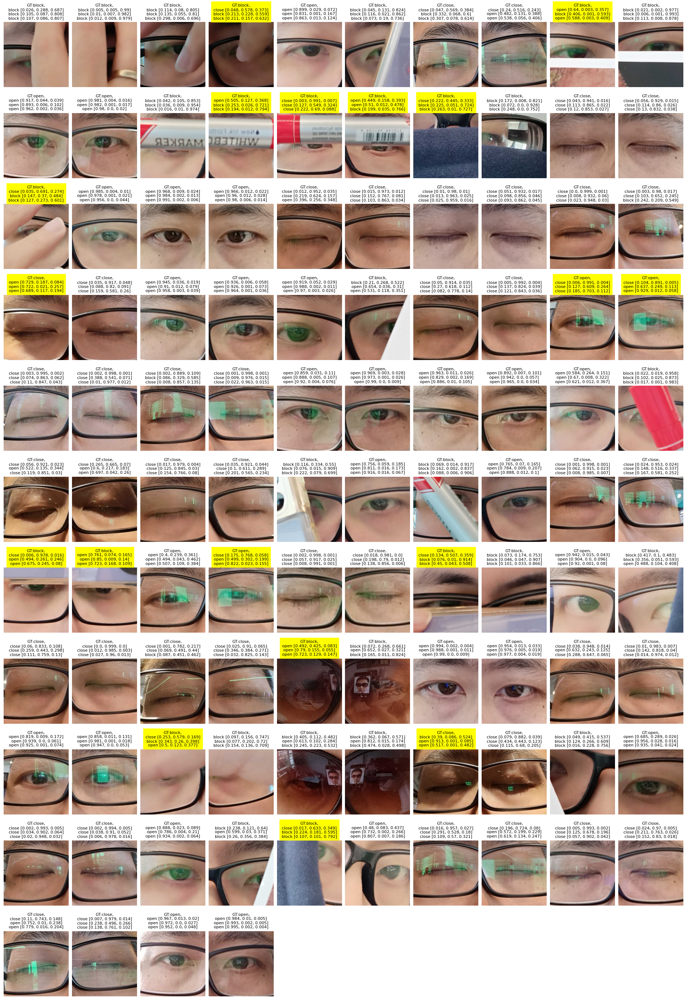

In [279]:
n_cols=10

indexes=zhitao.index
n_rows=int(np.ceil(len(indexes)/n_cols))
mapping={
    0:'open',
    1:'close',
    2:'block'
}

for i,ind in enumerate(tqdm(indexes)):
    image=zhitao_cropped_images[i]
    
    label=zhitao.loc[ind]['label']
    # softmax1=zhitao.loc[ind]['v2.0.1_epoch083_softmax']
    # softmax2=zhitao.loc[ind]['v3.0.18.1_epoch908_softmax']
    # softmax3=zhitao.loc[ind]['v2.9.3_epoch699_softmax']
    
    
    softmax1=zhitao.loc[ind]['v2.9.3_epoch699_softmax']
    softmax2=zhitao.loc[ind]['v2.9.3_epoch985_softmax']
    softmax3=zhitao.loc[ind]['v2.9.4_epoch656_softmax']
    
    
    softmax1=[round(x,3) for x in eval(softmax1)]
    softmax2=[round(x,3) for x in eval(softmax2)]    
    softmax3=[round(x,3) for x in eval(softmax3)]    
    pred1=mapping[np.argmax(softmax1)]
    pred2=mapping[np.argmax(softmax2)]
    pred3=mapping[np.argmax(softmax3)]
    title=f'GT:{label},\n{pred1} {softmax1}\n{pred2} {softmax2}\n{pred3} {softmax3}'
    
    if label!=pred1:
    # if label!=pred1 or label!=pred2:
        plt.subplot(n_rows,n_cols,i+1)
        plt.imshow(image)
        plt.title(title,fontsize=8,backgroundcolor='yellow')
        plt.axis('off')
    else:
        plt.subplot(n_rows,n_cols,i+1)
        plt.imshow(image)
        plt.title(title,fontsize=8)
        plt.axis('off')   

plt.subplots_adjust(hspace=0.1,wspace=0.05)
plt.gcf().set_size_inches(2.4*n_cols,3.2*n_rows)
plt.show()

# functions for case study

In [79]:
# function to get all the indices of the images in the confusion matrix itself - i.e. which image indices falls into which category in the NxN conf mat
import numpy as np
from sklearn.metrics import confusion_matrix

def get_confusion_matrix_and_indices(gt, pred, num_classes):   
    cm_indices = []
    for i in range(num_classes):
        row = []
        for j in range(num_classes):
            row.append(np.where((gt==i) & (pred==j))[0])
        cm_indices.append(row)
    cm_indices=np.array(cm_indices,dtype=object)
    
    cm=[]
    for i in range (cm_indices.shape[0]):
        row=[]
        for j in range (cm_indices.shape[1]):
            row.append(len(cm_indices[i,j]))
        cm.append(row)
    print(f"manual function confusion matrix output: \n {cm}")  
    return cm,cm_indices

# function to plot images
def plot_case_study(cm_indices,class_label,class_predicted,class_mapping,plot_rows,plot_cols,softmax_result,test_df,figsize=(10,10),counter=0):
    # only need to change counter if you decide to view all the images but dont want to plot all 1 shot - laggy
    
    indices=cm_indices[class_label,class_predicted]
    print(f"len of indices for (gt:{class_mapping[class_label]}, p:{class_mapping[class_predicted]}) is: {len(indices)}\n")
    
    # counter=0 # only need to change this if you decide to view all the images but dont want to plot all 1 shot - laggy
    fig,ax=plt.subplots(plot_rows,plot_cols,figsize=figsize)
    for i in range(plot_rows):
        for j in range(plot_cols):
            try:
                index=indices[counter + i*plot_cols+j]
                softmax_score=softmax_result[index]
                softmax_score=[round(x,3) for x in softmax_score]
                source = test_df.iloc[index,5]
                title_=str(index)+"\n"+str(softmax_score)
                # title_=str(index)+" "+str(source)+"\n"+str(softmax_score)
                # print(title_)
                image=test_dataset[index][0]
                image=image.permute(1,2,0).numpy()
                ax[i,j].imshow(image,cmap="gray")
                ax[i,j].axis("off")
                ax[i,j].set_title(title_,fontsize=8)
            except:
                ax[i,j].axis("off")
            # ax[i,j].set_title(f"gt:{class_label}, p:{class_predicted}")
    # plt.suptitle(f"GT: {class_mapping[class_label]}, P: {class_mapping[class_predicted]}",fontsize="xx-large",fontweight="bold")       
    plt.show()
    
class_mapping={0:"open",1:"close",2:"block"}
reverse_class_mapping={"open":0,"close":1,"block":2}

In [280]:
model_version='v2.9.3_epoch699_softmax'
# model_version='v3.0.18.1_epoch908_softmax'
# model_version='v2.0.1_epoch083_softmax'

In [281]:
test_df.label.value_counts()

label
block    933
open     930
close    784
Name: count, dtype: int64

In [282]:
#set label predictions and softmax
class_mapping={0:"open",1:"close",2:"block"}
reverse_class_mapping={"open":0,"close":1,"block":2}

label=np.array([reverse_class_mapping[x] for x in test_df.label.tolist()])
softmax_result=[eval(x) for x in test_df[model_version].tolist()]

print(csvPath)
print(model_version)

thre_close = 0.6
thre_block = 0.8
print(f"prediction using THRESHOLD\nthre_close: {thre_close}, thre_block: {thre_block}")

prediction=[]

for i in range(test_dataset.__len__()):
    p=softmax_result[i]
    if p[2]>thre_block:
        prediction.append(2)
    elif p[1]>thre_close:
        prediction.append(1)
    else:
        prediction.append(0) 
        
prediction=np.array(prediction)

from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay


for c, l in zip(['Open', 'Close', 'Block'], [0, 1, 2]):
    num = sum(label == l)
    corr = sum((prediction == l) & (label == l))
    print('%s: %d \t Correct: %d, %.2f%%' % (c, num, corr, corr / num * 100))

cm=confusion_matrix(label,prediction)
cm_disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=["open","close","block"],)
print(cm)
print()

print("prediction using ARGMAX")

prediction=[]

for i in range(test_dataset.__len__()):
    p=np.argmax(softmax_result[i])
    prediction.append(p)
        
prediction=np.array(prediction)

from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay

for c, l in zip(['Open', 'Close', 'Block'], [0, 1, 2]):
    num = sum(label == l)
    corr = sum((prediction == l) & (label == l))
    print('%s: %d \t Correct: %d, %.2f%%' % (c, num, corr, corr / num * 100))

cm=confusion_matrix(label,prediction)
cm_disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=["open","close","block"],)
print(cm)

/home/jovyan/data/aurora/eye-blink-production/data/v2.20/v2.20_data_test_results.csv
v2.9.3_epoch699_softmax
prediction using THRESHOLD
thre_close: 0.6, thre_block: 0.8
Open: 930 	 Correct: 906, 97.42%
Close: 784 	 Correct: 763, 97.32%
Block: 933 	 Correct: 321, 34.41%
[[906  24   0]
 [ 21 763   0]
 [511 101 321]]

prediction using ARGMAX
Open: 930 	 Correct: 889, 95.59%
Close: 784 	 Correct: 777, 99.11%
Block: 933 	 Correct: 594, 63.67%
[[889  37   4]
 [  6 777   1]
 [180 159 594]]


In [83]:
len(label),len(prediction)

(2647, 2647)

In [283]:
class_label,class_predicted=0,1

model version:  v2.9.3_epoch699_softmax

check sklearn cm function:
 [[889  37   4]
 [  6 777   1]
 [180 159 594]]
manual function confusion matrix output: 
 [[889, 37, 4], [6, 777, 1], [180, 159, 594]]
len of indices for (gt:open, p:close) is: 37



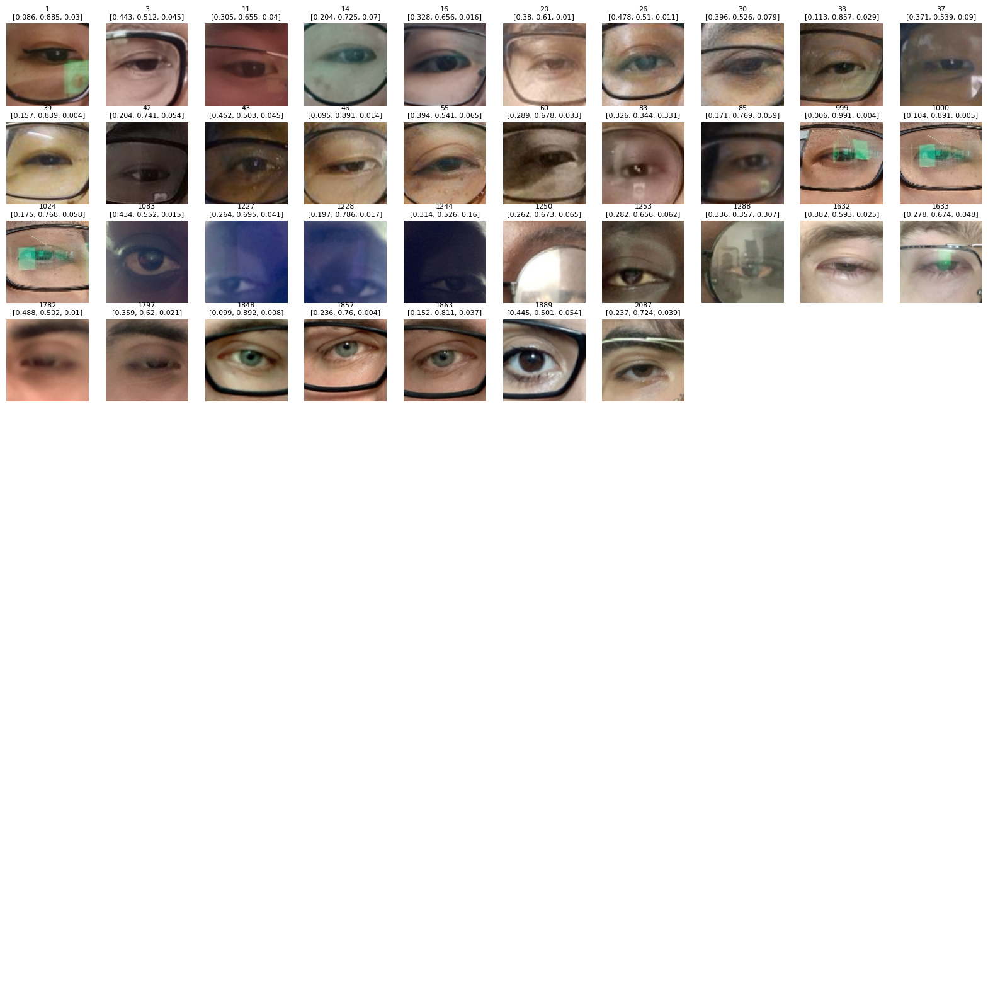

100%|██████████| 37/37 [00:00<00:00, 206919.00it/s]


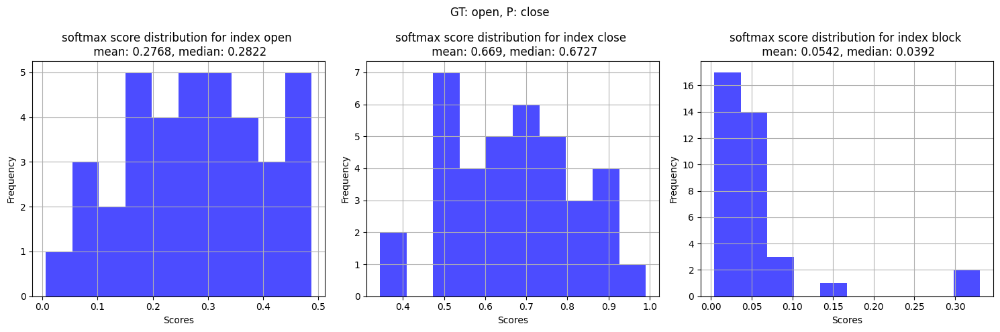

In [284]:
# case study code
print("model version: ",model_version)
print()


print("check sklearn cm function:\n",confusion_matrix(label,prediction))
cm,cm_indices=get_confusion_matrix_and_indices(label, prediction, num_classes=3)
plot_case_study(cm_indices,class_label,class_predicted,class_mapping,10,10,softmax_result,test_df,figsize=(20,20),counter=0)
# plot_case_study(cm_indices,class_label,class_predicted,class_mapping,10,10,softmax_result,test_df,figsize=(20,25),counter=0)

# full softmax scores distribution plot
import matplotlib.pyplot as plt


current_softmax_result=[]
for index in tqdm(cm_indices[class_label,class_predicted]):
    current_softmax_result.append(softmax_result[index])
current_softmax_result=np.array(current_softmax_result)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for index in range(3):
    # Extract scores for the current index
    scores = current_softmax_result[:, index]
    mean_score=round(np.mean(scores),4)
    median_score=round(np.median(scores),4)

    # Create a histogram for the current index
    axes[index].hist(scores, bins=10, color='blue', alpha=0.7)
    axes[index].set_xlabel('Scores')
    axes[index].set_ylabel('Frequency')
    axes[index].set_title(f'softmax score distribution for index {class_mapping[index]} \n mean: {mean_score}, median: {median_score}')
    axes[index].grid(True)

# Adjust spacing between subplots
plt.suptitle(f'GT: {class_mapping[class_label]}, P: {class_mapping[class_predicted]}')
plt.tight_layout()
# Show the subplots
plt.show()

In [318]:
class_label,class_predicted=1,1
model_version = 'v2.9.3_epoch699_softmax'

model version:  v2.9.3_epoch699_softmax

check sklearn cm function:
 [[732 158  40]
 [ 11 740  33]
 [385 375 173]]
manual function confusion matrix output: 
 [[732, 158, 40], [11, 740, 33], [385, 375, 173]]
len of indices for (gt:close, p:close) is: 740



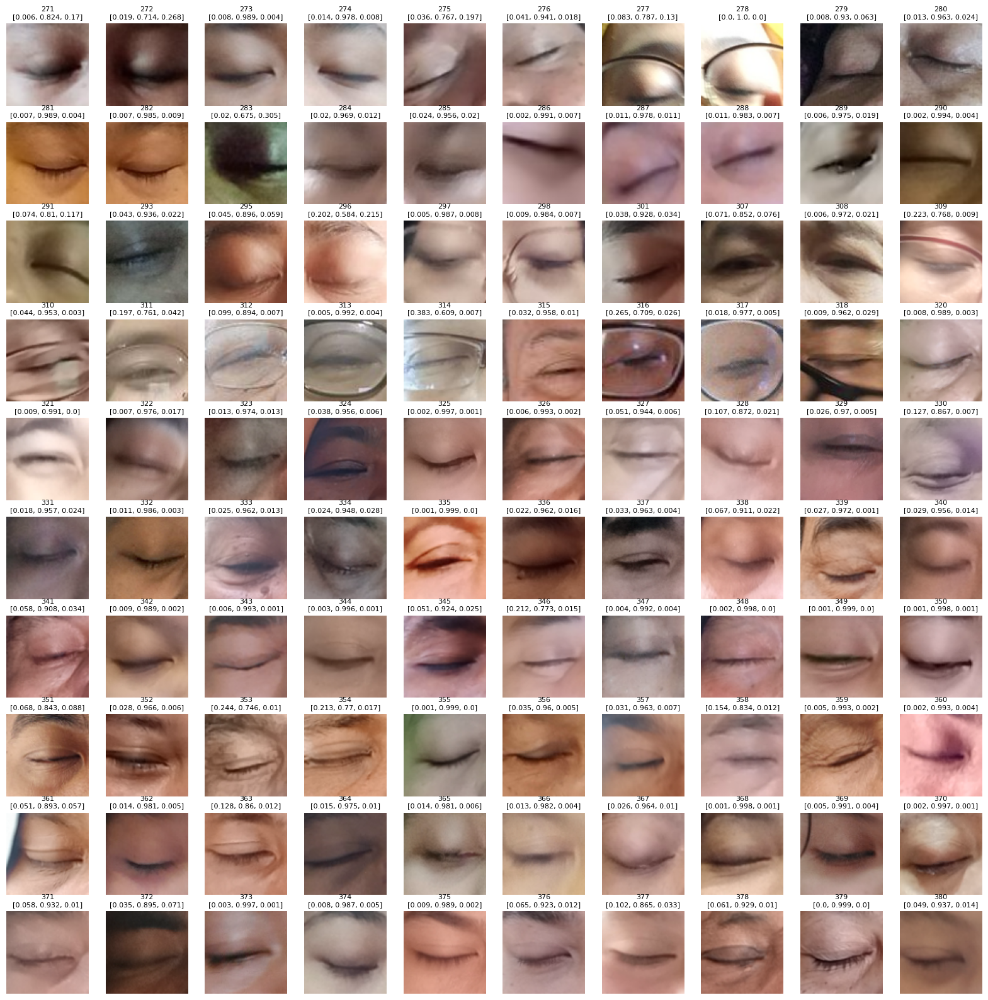

100%|██████████| 740/740 [00:00<00:00, 1394332.87it/s]


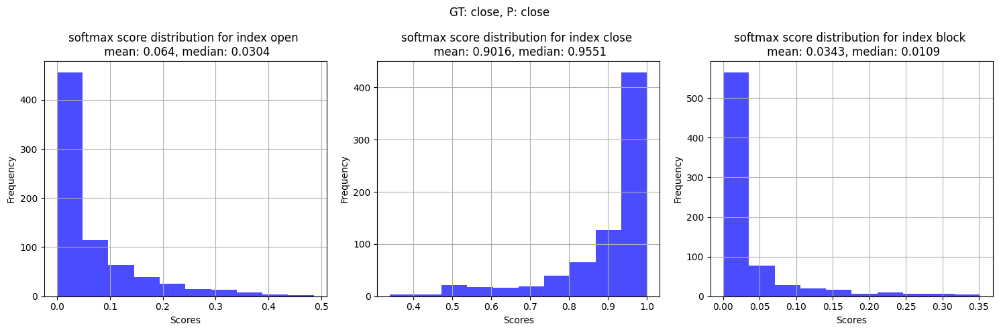

In [319]:
# case study code
print("model version: ",model_version)
print()


print("check sklearn cm function:\n",confusion_matrix(label,prediction))
cm,cm_indices=get_confusion_matrix_and_indices(label, prediction, num_classes=3)
plot_case_study(cm_indices,class_label,class_predicted,class_mapping,10,10,softmax_result,test_df,figsize=(20,20),counter=0)
# plot_case_study(cm_indices,class_label,class_predicted,class_mapping,10,10,softmax_result,test_df,figsize=(20,25),counter=0)

# full softmax scores distribution plot
import matplotlib.pyplot as plt


current_softmax_result=[]
for index in tqdm(cm_indices[class_label,class_predicted]):
    current_softmax_result.append(softmax_result[index])
current_softmax_result=np.array(current_softmax_result)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for index in range(3):
    # Extract scores for the current index
    scores = current_softmax_result[:, index]
    mean_score=round(np.mean(scores),4)
    median_score=round(np.median(scores),4)

    # Create a histogram for the current index
    axes[index].hist(scores, bins=10, color='blue', alpha=0.7)
    axes[index].set_xlabel('Scores')
    axes[index].set_ylabel('Frequency')
    axes[index].set_title(f'softmax score distribution for index {class_mapping[index]} \n mean: {mean_score}, median: {median_score}')
    axes[index].grid(True)

# Adjust spacing between subplots
plt.suptitle(f'GT: {class_mapping[class_label]}, P: {class_mapping[class_predicted]}')
plt.tight_layout()
# Show the subplots
plt.show()

In [285]:
class_label,class_predicted=1,0

model version:  v2.9.3_epoch699_softmax

check sklearn cm function:
 [[889  37   4]
 [  6 777   1]
 [180 159 594]]
manual function confusion matrix output: 
 [[889, 37, 4], [6, 777, 1], [180, 159, 594]]
len of indices for (gt:close, p:open) is: 6



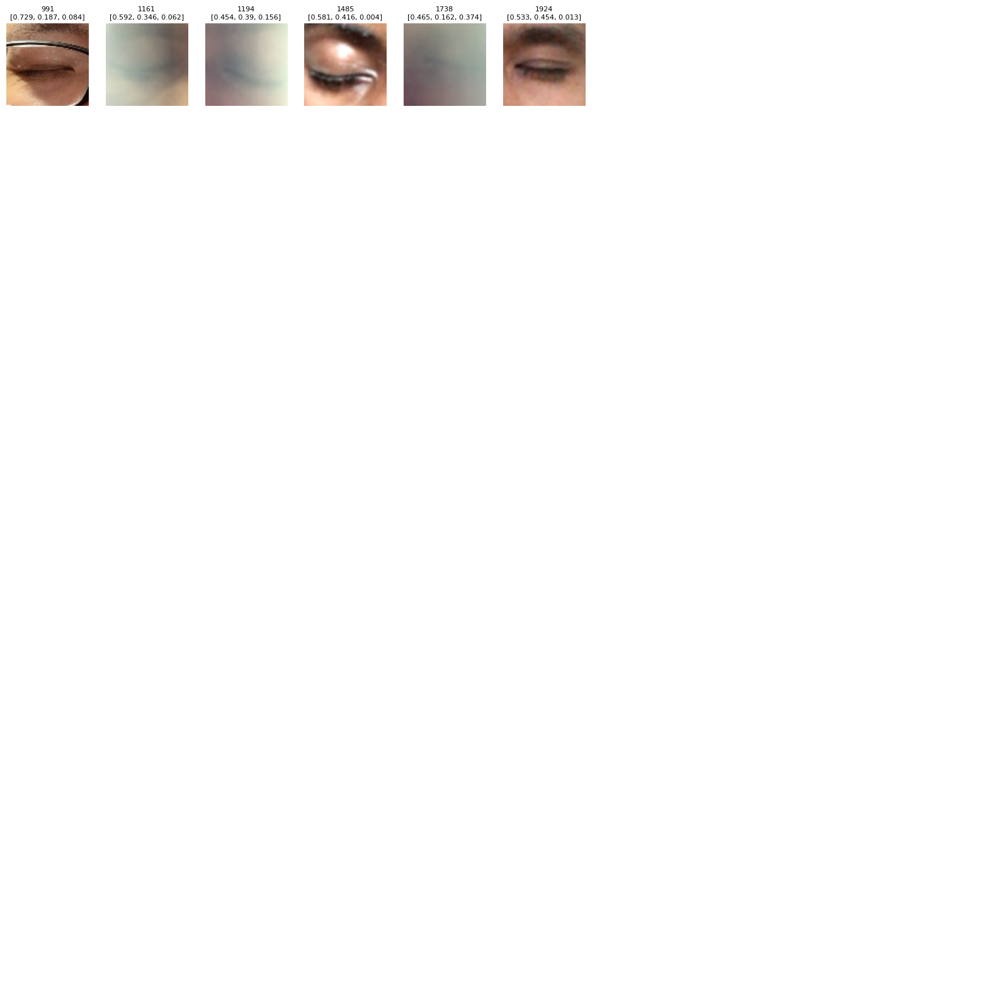

100%|██████████| 6/6 [00:00<00:00, 65707.11it/s]


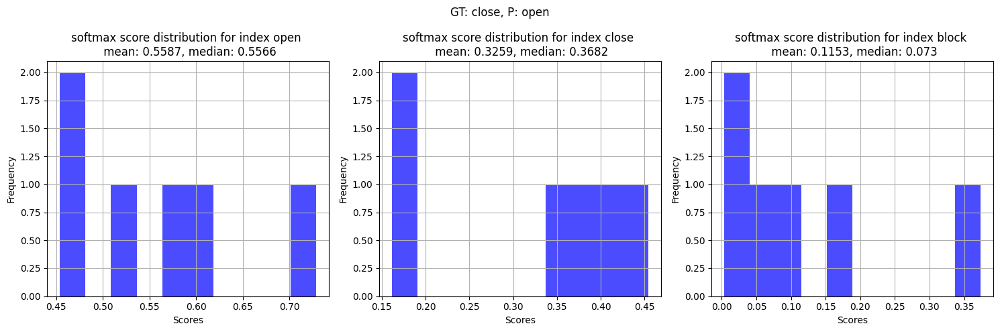

In [286]:
# case study code
print("model version: ",model_version)
print()


print("check sklearn cm function:\n",confusion_matrix(label,prediction))
cm,cm_indices=get_confusion_matrix_and_indices(label, prediction, num_classes=3)
plot_case_study(cm_indices,class_label,class_predicted,class_mapping,10,10,softmax_result,test_df,figsize=(20,20),counter=0)
# plot_case_study(cm_indices,class_label,class_predicted,class_mapping,10,10,softmax_result,test_df,figsize=(20,25),counter=0)

# full softmax scores distribution plot
import matplotlib.pyplot as plt


current_softmax_result=[]
for index in tqdm(cm_indices[class_label,class_predicted]):
    current_softmax_result.append(softmax_result[index])
current_softmax_result=np.array(current_softmax_result)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for index in range(3):
    # Extract scores for the current index
    scores = current_softmax_result[:, index]
    mean_score=round(np.mean(scores),4)
    median_score=round(np.median(scores),4)

    # Create a histogram for the current index
    axes[index].hist(scores, bins=10, color='blue', alpha=0.7)
    axes[index].set_xlabel('Scores')
    axes[index].set_ylabel('Frequency')
    axes[index].set_title(f'softmax score distribution for index {class_mapping[index]} \n mean: {mean_score}, median: {median_score}')
    axes[index].grid(True)

# Adjust spacing between subplots
plt.suptitle(f'GT: {class_mapping[class_label]}, P: {class_mapping[class_predicted]}')
plt.tight_layout()
# Show the subplots
plt.show()

In [287]:
class_label,class_predicted=2,0

model version:  v2.9.3_epoch699_softmax

check sklearn cm function:
 [[889  37   4]
 [  6 777   1]
 [180 159 594]]
manual function confusion matrix output: 
 [[889, 37, 4], [6, 777, 1], [180, 159, 594]]
len of indices for (gt:block, p:open) is: 180



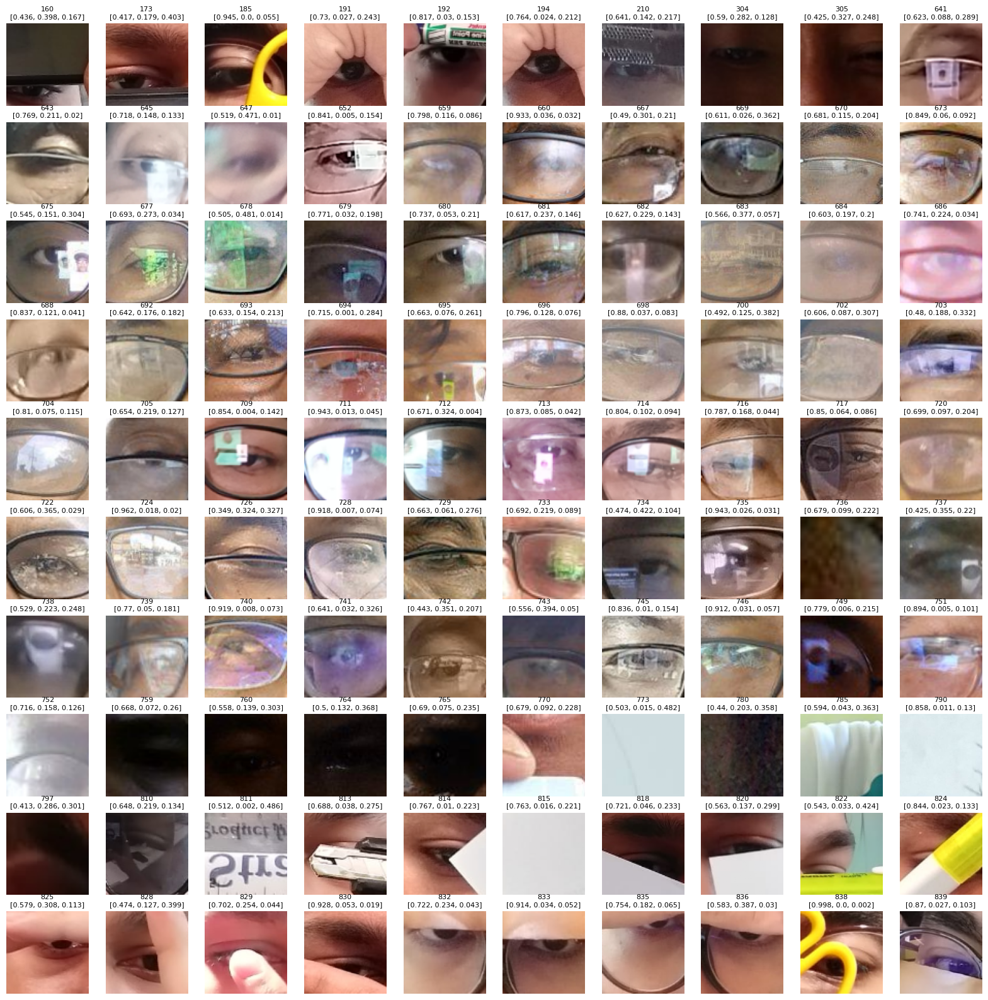

100%|██████████| 180/180 [00:00<00:00, 856952.01it/s]


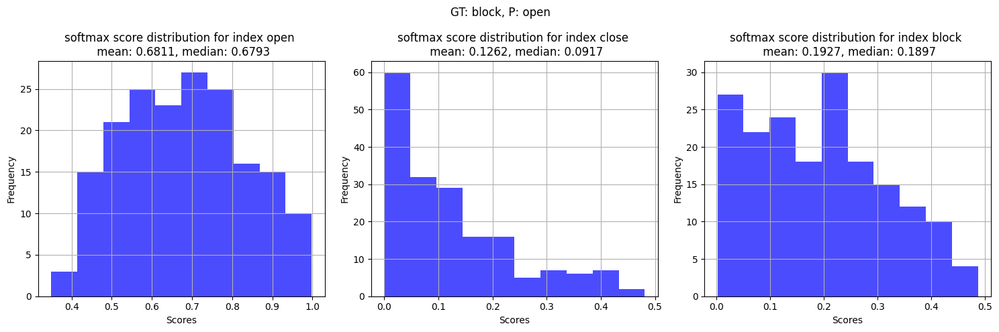

In [288]:
# case study code
print("model version: ",model_version)
print()


print("check sklearn cm function:\n",confusion_matrix(label,prediction))
cm,cm_indices=get_confusion_matrix_and_indices(label, prediction, num_classes=3)
plot_case_study(cm_indices,class_label,class_predicted,class_mapping,10,10,softmax_result,test_df,figsize=(20,20),counter=0)
# plot_case_study(cm_indices,class_label,class_predicted,class_mapping,10,10,softmax_result,test_df,figsize=(20,25),counter=0)

# full softmax scores distribution plot
import matplotlib.pyplot as plt


current_softmax_result=[]
for index in tqdm(cm_indices[class_label,class_predicted]):
    current_softmax_result.append(softmax_result[index])
current_softmax_result=np.array(current_softmax_result)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for index in range(3):
    # Extract scores for the current index
    scores = current_softmax_result[:, index]
    mean_score=round(np.mean(scores),4)
    median_score=round(np.median(scores),4)

    # Create a histogram for the current index
    axes[index].hist(scores, bins=10, color='blue', alpha=0.7)
    axes[index].set_xlabel('Scores')
    axes[index].set_ylabel('Frequency')
    axes[index].set_title(f'softmax score distribution for index {class_mapping[index]} \n mean: {mean_score}, median: {median_score}')
    axes[index].grid(True)

# Adjust spacing between subplots
plt.suptitle(f'GT: {class_mapping[class_label]}, P: {class_mapping[class_predicted]}')
plt.tight_layout()
# Show the subplots
plt.show()

In [289]:
class_label,class_predicted=2,1

model version:  v2.9.3_epoch699_softmax

check sklearn cm function:
 [[889  37   4]
 [  6 777   1]
 [180 159 594]]
manual function confusion matrix output: 
 [[889, 37, 4], [6, 777, 1], [180, 159, 594]]
len of indices for (gt:block, p:close) is: 159



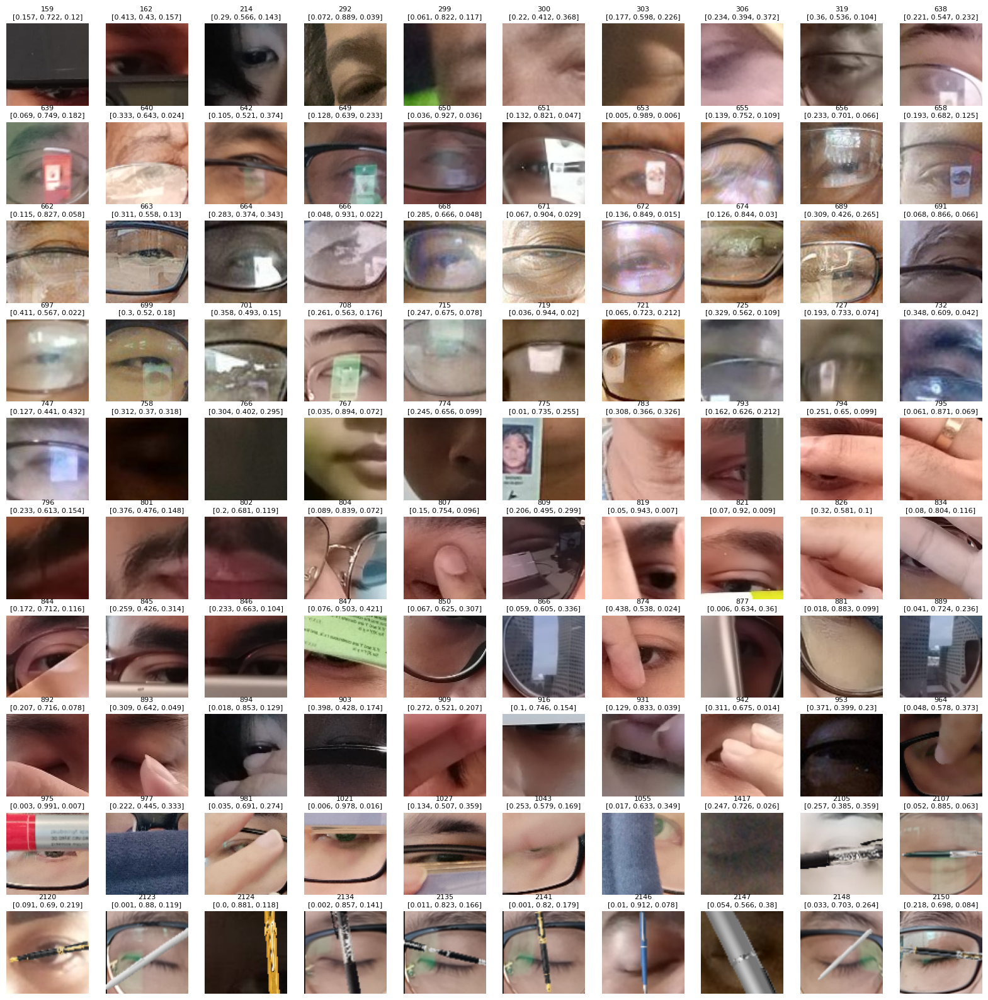

100%|██████████| 159/159 [00:00<00:00, 792977.81it/s]


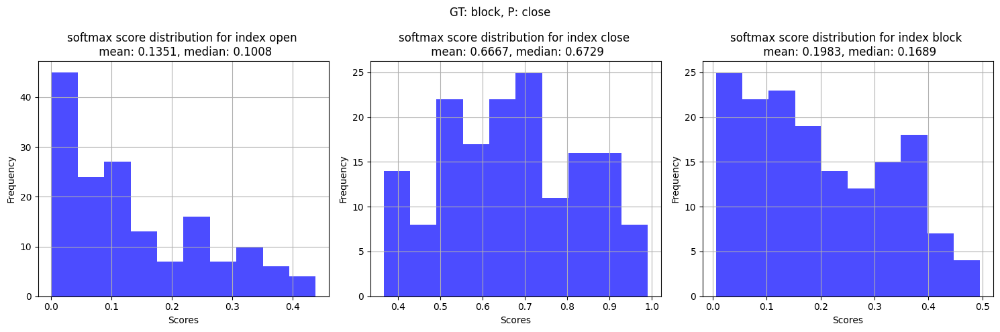

In [290]:
# case study code
print("model version: ",model_version)
print()


print("check sklearn cm function:\n",confusion_matrix(label,prediction))
cm,cm_indices=get_confusion_matrix_and_indices(label, prediction, num_classes=3)
plot_case_study(cm_indices,class_label,class_predicted,class_mapping,10,10,softmax_result,test_df,figsize=(20,20),counter=0)
# plot_case_study(cm_indices,class_label,class_predicted,class_mapping,10,10,softmax_result,test_df,figsize=(20,25),counter=0)

# full softmax scores distribution plot
import matplotlib.pyplot as plt


current_softmax_result=[]
for index in tqdm(cm_indices[class_label,class_predicted]):
    current_softmax_result.append(softmax_result[index])
current_softmax_result=np.array(current_softmax_result)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for index in range(3):
    # Extract scores for the current index
    scores = current_softmax_result[:, index]
    mean_score=round(np.mean(scores),4)
    median_score=round(np.median(scores),4)

    # Create a histogram for the current index
    axes[index].hist(scores, bins=10, color='blue', alpha=0.7)
    axes[index].set_xlabel('Scores')
    axes[index].set_ylabel('Frequency')
    axes[index].set_title(f'softmax score distribution for index {class_mapping[index]} \n mean: {mean_score}, median: {median_score}')
    axes[index].grid(True)

# Adjust spacing between subplots
plt.suptitle(f'GT: {class_mapping[class_label]}, P: {class_mapping[class_predicted]}')
plt.tight_layout()
# Show the subplots
plt.show()

# others

## inference code

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import timm


class Eye_Net(nn.Module):
    def __init__(self,in_channel=3):
        super(Eye_Net, self).__init__()
        self.backbone = timm.create_model("mobilenetv3_small_050", in_chans=in_channel, pretrained=True, features_only=True, drop_rate=0.5)        
        self.dropout = nn.Dropout(0.5)
        self.max_pool = nn.MaxPool2d(2)
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(288,3)

    def forward(self, x):
        x = self.backbone(x)
        x = self.max_pool(x[-1])
        x = self.dropout(x)
        x = self.flatten(x)
        x = self.fc(x)

        return x
    
device=torch.device('cpu')
model=Eye_Net()
# change path
model_path='/home/jovyan/Eye 3/Eye/train/result/v3.0.17.0/epoch177.pt' 
model.load_state_dict(torch.load(model_path, map_location = device))
_ = model.eval()

# test
print(model(torch.zeros((1,3,80,80))))
print(model(torch.ones((1,3,80,80))))

## check model summary

In [91]:
import timm
from torchsummary import summary

dropout=0
# backbone = timm.create_model('lcnet_035', num_classes=3, pretrained=True, drop_rate=dropout).cuda()
backbone = timm.create_model('mobilenetv3_small_050', num_classes=3, pretrained=True, drop_rate=dropout).cuda()
# backbone
# timm.list_models()
summary(backbone,input_size=(3,80,80))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 40, 40]             432
          Identity-2           [-1, 16, 40, 40]               0
         Hardswish-3           [-1, 16, 40, 40]               0
    BatchNormAct2d-4           [-1, 16, 40, 40]              32
            Conv2d-5           [-1, 16, 20, 20]             144
          Identity-6           [-1, 16, 20, 20]               0
              ReLU-7           [-1, 16, 20, 20]               0
    BatchNormAct2d-8           [-1, 16, 20, 20]              32
            Conv2d-9              [-1, 8, 1, 1]             136
             ReLU-10              [-1, 8, 1, 1]               0
           Conv2d-11             [-1, 16, 1, 1]             144
      Hardsigmoid-12             [-1, 16, 1, 1]               0
    SqueezeExcite-13           [-1, 16, 20, 20]               0
           Conv2d-14            [-1, 8,

In [90]:
model = Eye_Net(in_channel = 3).cuda()
summary(model,input_size=(3,80,80))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 40, 40]             896
       BatchNorm2d-2           [-1, 32, 40, 40]              64
            Conv2d-3           [-1, 64, 20, 20]          18,496
       BatchNorm2d-4           [-1, 64, 20, 20]             128
            Conv2d-5             [-1, 64, 8, 8]           3,136
       BatchNorm2d-6             [-1, 64, 8, 8]             128
             ReLU6-7             [-1, 64, 8, 8]               0
            Conv2d-8             [-1, 64, 8, 8]           4,096
       BatchNorm2d-9             [-1, 64, 8, 8]             128
 InvertedResidual-10             [-1, 64, 8, 8]               0
           Conv2d-11             [-1, 32, 1, 1]           2,080
      BatchNorm2d-12             [-1, 32, 1, 1]              64
           Conv2d-13              [-1, 3, 1, 1]              99
      BatchNorm2d-14              [-1, 

In [88]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class InvertedResidual(nn.Module):
    def __init__(self, inp, oup, stride=1, expand_ratio=1, kernel=3, padding=1):
        super(InvertedResidual, self).__init__()
        self.stride = stride
        assert stride in [1, 2]

        self.use_res_connect = self.stride == 1 and inp == oup

        self.conv = nn.Sequential(
            # pw
            # nn.Conv2d(inp, inp * expand_ratio, 1, 1, 0, bias=False),
            # # nn.BatchNorm2d(inp * expand_ratio),
            # nn.ReLU6(inplace=True),
            # dw
            nn.Conv2d(inp * expand_ratio, inp * expand_ratio, kernel, stride, padding, groups=inp * expand_ratio, bias=False),
            nn.BatchNorm2d(inp * expand_ratio),
            nn.ReLU6(inplace=True),
            # pw-linear
            nn.Conv2d(inp * expand_ratio, oup, 1, 1, 0, bias=False),
            nn.BatchNorm2d(oup),
        )

    def forward(self, x):

        if self.use_res_connect:
            return x + self.conv(x)
        else:
            return self.conv(x)

class R_Net(nn.Module):
    def __init__(self,in_channel):
        super(R_Net, self).__init__()
        self.conv_r=InvertedResidual(64,64,kernel=7,stride=2)
        self.fc1=nn.Sequential(
            nn.Conv2d(64,32,1,1),
            nn.BatchNorm2d(32),
        )
        self.fc2=nn.Sequential(
            nn.Conv2d(32,3,1,1),
            nn.BatchNorm2d(3),
        )
        
    def forward(self,input):
        x=self.conv_r(input)
        x_pool=F.adaptive_avg_pool2d(x,1)
        x_fc1=self.fc1(x_pool)
        x_fc2=self.fc2(x_fc1)
        output=x_fc2.view(x_fc2.shape[0],-1)
        return  output


class Eye_Net(nn.Module):
    def __init__(self, in_channel, is_normalized = False):
        super(Eye_Net, self).__init__()
        self.stem=nn.Sequential(
            nn.Conv2d(in_channel, 32, kernel_size=3, stride=2,padding=1), # （256-3+2）//2+1=253//2+1=128
            nn.BatchNorm2d(32),
            nn.Conv2d(32, 64, kernel_size=3, stride=2,padding=1), # 127//2+1=64
            nn.BatchNorm2d(64),
        )
        self.rnet=R_Net(in_channel = 64)
        
    def forward(self,x):
        stem_x=self.stem(x)
        light_par=self.rnet(stem_x)
        return light_par
    

## find best close acc for model 

In [94]:
folder="v3.0.19.4.3"
log_path=f'/home/jovyan/Eye/train/result/{folder}/train2step_record.txt'
with open(log_path, 'r') as f:
    log = f.readlines()
train_loss_list = []
val_loss_list = []
acc_open_list = []
acc_close_list = []
acc_block_list = []

for x in log:
    if "train loss" in x:
        try:
            train_loss = float(x.split(", ")[0].split(" : ")[1].split(" = ")[1])
            val_loss = float(x.split(", ")[1].split(" = ")[1].split(",")[0])
            train_loss_list.append(train_loss)
            val_loss_list.append(val_loss)
        except:
            continue
    if 'Acc-open' in x:
        try:
            acc_open=float(x.split(',')[0].split(':')[1][1:6])
            acc_close=float(x.split(',')[1].split(':')[1][1:6])
            acc_block=float(x.split(',')[2].split(':')[1][1:6])
            acc_open_list.append(acc_open)
            acc_close_list.append(acc_close)
            acc_block_list.append(acc_block)
        except:
            pass
        

min_index=val_loss_list.index(min(val_loss_list))
print(min_index)
print(acc_open_list[min_index],acc_close_list[min_index],acc_block_list[min_index])
# print(len(val_loss_list))
print(sorted(acc_close_list,reverse=True)[:5])
print()
print(sorted(val_loss_list)[:5])
print(sorted(val_loss_list,reverse=True)[:5])

565
99.42 99.18 98.84
[99.62, 99.62, 99.62, 99.56, 99.56]

[0.0376148, 0.0379812, 0.0381206, 0.0382344, 0.0384639]
[0.584857, 0.12564, 0.111194, 0.0955081, 0.0928131]


In [95]:
for i in range(len(acc_close_list)):
    if acc_close_list[i]==99.62:
        print(i,val_loss_list[i],acc_open_list[i],acc_close_list[i],acc_block_list[i])

144 0.0465532 99.35 99.62 98.41
185 0.0439161 99.45 99.62 98.31
274 0.0419382 99.38 99.62 98.37
